# Gravity!

In [32]:
%matplotlib inline

---
# Function Definitions
---

In [2]:
# Define a function that will calculate the graviational attraction and it's deriviative for two bodies.

def grav2(y, t, m0, m1, G):
    
    # y is the initial values vector
    # t is the vector of times to calculate over
    # m0, m1 are the masses of the bodies
    # G is newtons graviational constant
    
    
    # Extract the values from the vector passed
    
    r0, v0 = y[0:2], y[2:4]
    r1, v1 = y[4:6], y[6:8]
        
    # Get the normalised distance between all three bodies
    
    r1r0 = np.linalg.norm(r1 - r0)
    
    # Set a minimum distance two bodies can approach and limit their maxixmum forces to this distance
    
    if r1r0 < 0.01:
        r1r0 = 0.01
        
    
    # Calculate the gravitational acceleration on each body
    
    a0 = m1 * G * (r1-r0)/(r1r0)**3
    a1 = m0 * G * (r0-r1)/(r1r0)**3
    
    
    # Create the vector that returns the velocities and accelerations
    
    dydx = [v0[0], v0[1], a0[0] , a0[1] , v1[0], v1[1], a1[0], a1[1] ]
    
    
    # Return this
    
    return dydx
    

In [3]:
# Define a function that will calculate the graviational attraction and it's deriviative for three bodies.

def grav3(y, t, m0, m1, m2, G):
    
    # y is the initial values vector
    # t is the vector of times to calculate over
    # m0, m1, m2 are the masses of the bodies
    # G is newtons graviational constant
    
    
    # Extract the values from the vector passed
    
    r0, v0 = y[0:2], y[2:4]
    r1, v1 = y[4:6], y[6:8]
    r2, v2 = y[8:10], y[10:12]
    
    
    # Get the normalised distance between all three bodies
    
    r1r0 = np.linalg.norm(r1 - r0)
    r1r2 = np.linalg.norm(r1 - r2)
    r0r2 = np.linalg.norm(r0 - r2)
    
    
    # Set a minimum distance two bodies can approach and limit their maxixmum forces to this distance
    
    if r1r0 < 0.01:
        r1r0 = 0.01
    if r1r2 < 0.01:
        r1r2 = 0.01
    if r0r2 < 0.01:
        r0r2 = 0.01
        
    
    # Calculate the gravitational acceleration on each body
    
    a0 = m1 * G * (r1-r0)/(r1r0)**3 + m2 * G * (r2-r0)/(r0r2)**3
    a1 = m0 * G * (r0-r1)/(r1r0)**3 + m2 * G * (r2-r1)/(r1r2)**3
    a2 = m0 * G * (r0-r2)/(r0r2)**3 + m1 * G * (r1-r2)/(r1r2)**3
    
    
    # Create the vector that returns the velocities and accelerations
    
    dydx = [v0[0], v0[1], a0[0] , a0[1] , v1[0], v1[1], a1[0], a1[1], v2[0], v2[1], a2[0], a2[1] ]
    
    
    # Return this
    
    return dydx
    

In [4]:
def energy2(y, m0, m1):
    
    # Calculates the energy of a particle from E = T + V = 1/2 mV^2 - GMm/R for two boeies
    
    # y is a 4 vector of [xpos, ypos, xvel, yvel]
    # M is the mass of the OTHER body
    
    r10 = np.linalg.norm([y[4] - y[0], y[5] - y[1]])
    v0 = np.linalg.norm(y[2:4])
    v1 = np.linalg.norm(y[6:8])
    
    T = (1/2.0) * (v0**2) + (1/2.0) * (v1**2)
    V = - (G * m0) / r10 - (G * m1) / r10
    print(T)
    print(V)
    
    return (T + V)

In [12]:
def energy3(y, m0, m1, m2):
    
    # Calculates the energy of a particle from E = T + V = 1/2 mV^2 - GMm/R for two boeies
    
    # y is a 4 vector of [xpos, ypos, xvel, yvel]
    # M is the mass of the OTHER body
    
    r10 = np.linalg.norm([y[4] - y[0], y[5] - y[1]])
    r12 = np.linalg.norm([y[8] - y[4], y[9] - y[5]])
    r20 = np.linalg.norm([y[8] - y[0], y[9] - y[1]])

    v0 = np.linalg.norm(y[2:4])
    v1 = np.linalg.norm(y[6:8])
    v2 = np.linalg.norm(y[10:12])

    
    T = (1/2.0) * (v0**2) + (1/2.0) * (v1**2) + (1/2.0) * (v2**2)
    V = - (G * m0) / r10 - (G * m1) / r10 \
        - (G * m2) / r12 - (G * m1) / r12 \
        - (G * m0) / r20 - (G * m2) / r20 
    print("Total T: " + str(T))
    print("Total V: " + str(V))
    
    return (T + V)

In [16]:
def com2(y0,m0,m1):
    
    # Calculates the centre of mass for two bodies
    m_tot = m0 + m1
    xcom = (m0 * y0[0] + m1 * y[4]) / m_tot
    ycom = (m0 * y0[1] + m1 * y[5]) / m_tot
    
    print("Centre Of Mass: " + str(np.array([xcom, ycom])))
    return np.array([xcom, ycom])

In [80]:
def com3(y0,m0,m1,m2):
    
    # Calculates the centre of mass for two bodies
    m_tot = m0 + m1 + m2
    xcom = (m0 * y0[0] + m1 * y[4] + m2 * y[8]) / m_tot
    ycom = (m0 * y0[1] + m1 * y[5] + m2 * y[9]) / m_tot
    
    print("Centre Of Mass: " + str(np.array([xcom, ycom])))
    return np.array([xcom, ycom])

In [17]:
def comv2(y0,m0,m1):
    
    # Calculates the centre of mass for two bodies
    m_tot = m0 + m1
    xcomv = (m0 * y0[2] + m1 * y[6]) / m_tot
    ycomv = (m0 * y0[3] + m1 * y[7]) / m_tot
    
    print("Centre Of Mass Velocity: " + str(np.array([xcomv, ycomv])))

    return np.array([xcomv, ycomv])

In [81]:
def comv3(y0,m0,m1,m3):
    
    # Calculates the centre of mass for three bodies
    m_tot = m0 + m1 + m2
    xcomv = (m0 * y0[2] + m1 * y[6] + m2 * y[10]) / m_tot
    ycomv = (m0 * y0[3] + m1 * y[7] + m2 * y[11]) / m_tot
    
    print("Centre Of Mass Velocity: " + str(np.array([xcomv, ycomv])))

    return np.array([xcomv, ycomv])

In [85]:
def randompos2(y0, m0, m1):
    
    # Given an initial object mass and object 1 position and velocity,
    # returns a random object 2 position and velocity that will result in 
    # 0 com and 0 comv
    
    m_tot = m0 + m1
    xpos = -(m0 * y0[0])/m1
    ypos = -(m0 * y0[1])/m1
    xvel = -(m0 * y0[2])/m1
    yvel = -(m0 * y0[3])/m1
    
    return np.array([xpos, ypos, xvel, yvel])

In [86]:
def randompos3(y0, m0, m1, m2):
    
    # Given an initial object mass and object 1 and 2 position and velocity,
    # returns a random object 3 position and velocity that will result in 
    # 0 com and 0 comv
    
    m_tot = m0 + m1 + m2
    xpos = -(m0 * y0[0] + m1 * y[4])/m2
    ypos = -(m0 * y0[1] + m1 * y[5])/m2
    xvel = -(m0 * y0[2] + m1 * y[6])/m2
    yvel = -(m0 * y0[3] + m1 * y[7])/m2
    
    return np.array([xpos, ypos, xvel, yvel])

---
# Simulation
---

Total T: 2.5
Total V: -15.8537758039
Centre Of Mass: [ 0.  0.]
Centre Of Mass Velocity: [ 0.  0.]
Bound


(-0.5, 1.5, -3.0, 1.0)

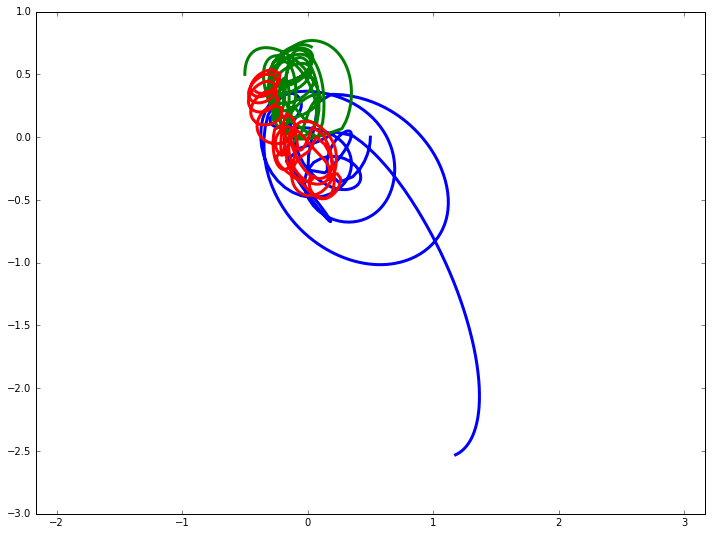

In [103]:
from scipy.integrate import odeint
import numpy as np
import pylab as plt


# Masses of the bodies

m0 = 1.0
m1 = 2.0
m2 = 3.0


# Newtons Constant

G = 1


# Initial positions and velocities of each body (x0, y0, vx0, vy0) 

ri0 = np.array([ 0.5,  0.0,  0.0, -2.0])
ri1 = np.array([-0.5,  0.5,  0.0,  1.0])
ri2 = np.array([0.0, 0.1, 0.0, 0.2])

y = np.hstack([ri0,ri1])

rran = randompos3(ri0, m0, m1, m2)

# Place these into a single array

y = np.hstack([ri0,ri1, rran])


# Set up a time vector

t = np.linspace(0, 10, 500)


# Calculate the total energy


E = energy3(y, m0, m1, m2)
com = com3(y, m0, m1, m2)
comv = comv3(y, m0, m1, m2)

if E < 0:
    print('Bound')
else: 
    print('UnBound')
# Run the integration

sol = odeint(grav3, y, t, args=(m0, m1, m2, G))


# Plot the result
plt.figure(figsize=(12,9))
plt.plot(sol[:,0], sol[:,1], lw = 3)
plt.plot(sol[:,4], sol[:,5], lw = 3)
plt.plot(sol[:,8], sol[:,9], lw = 3)
plt.axis('equal') 

##### ---
# Animation
---


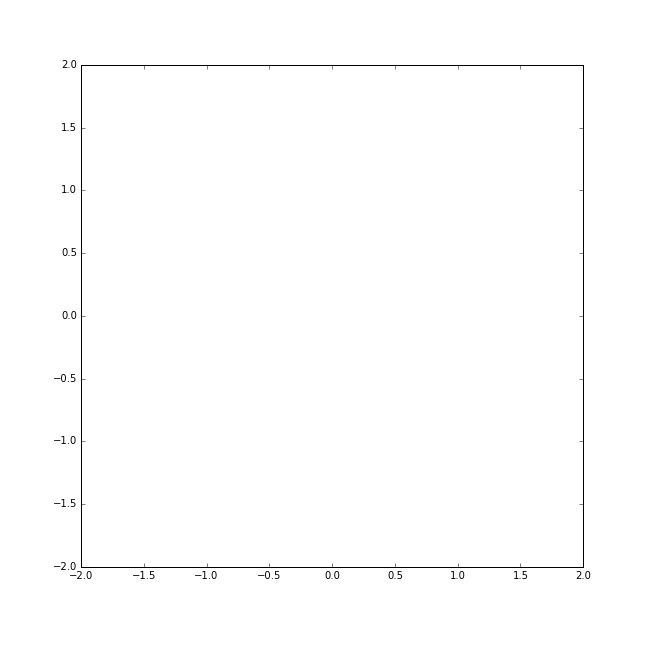
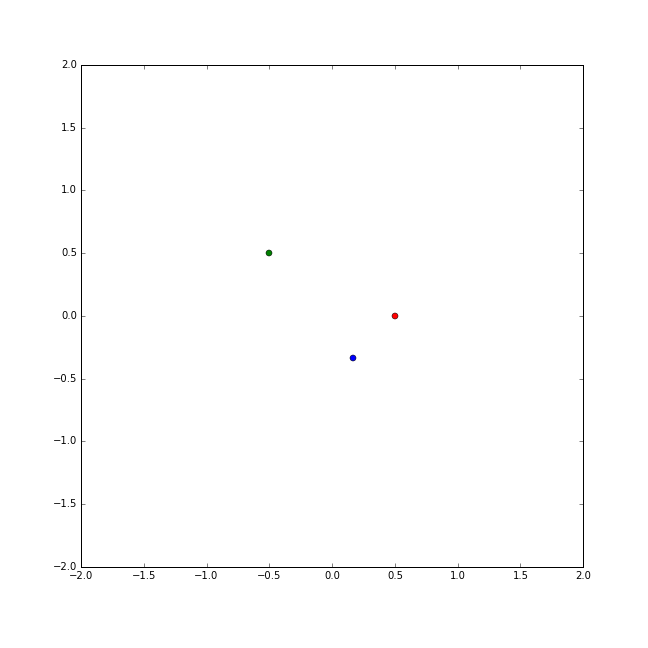
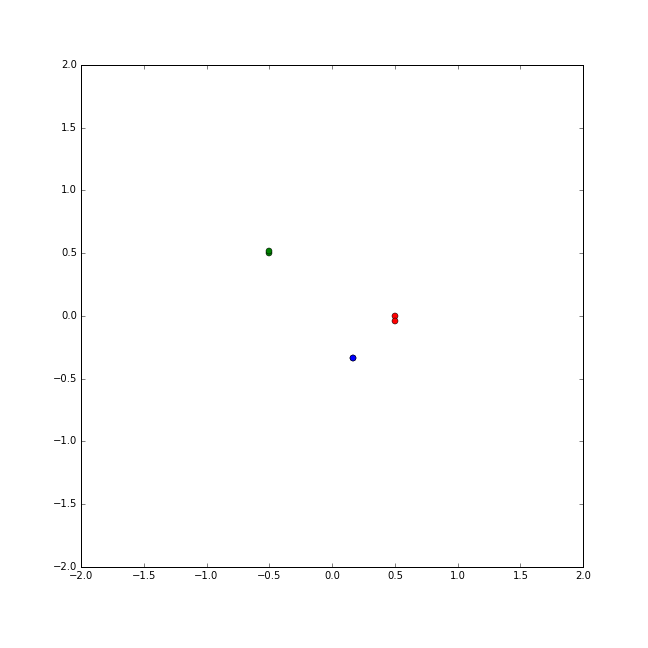
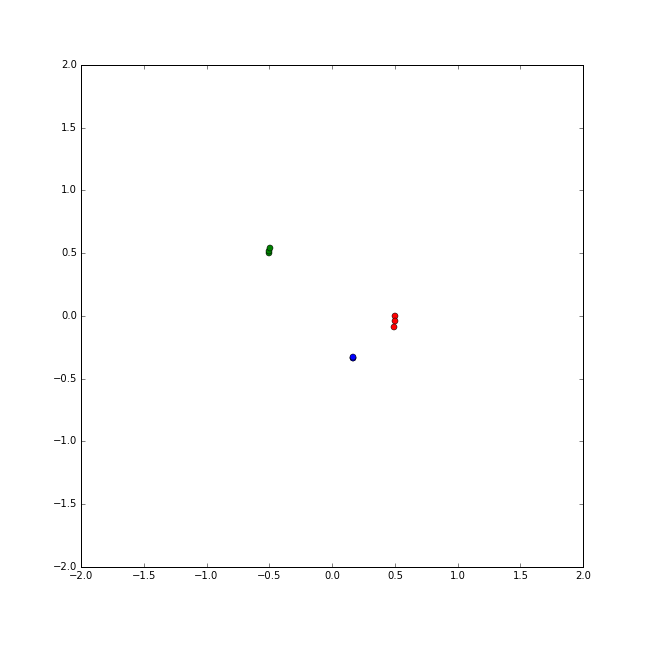
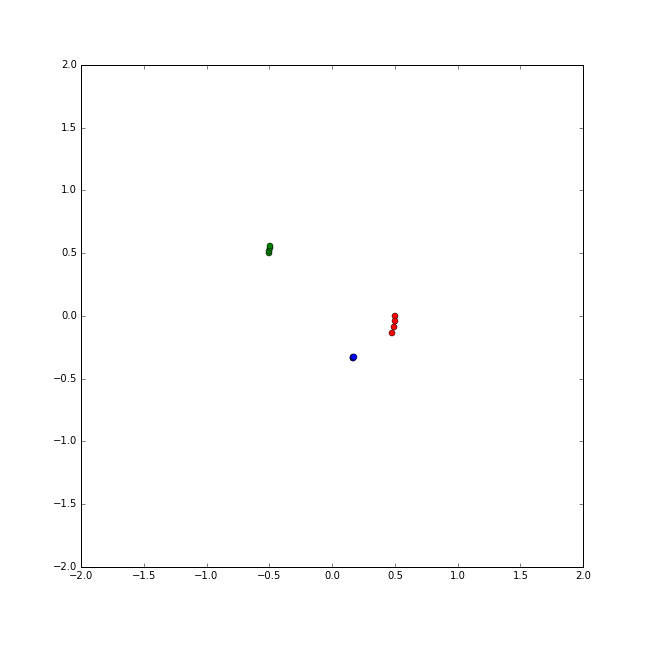
...
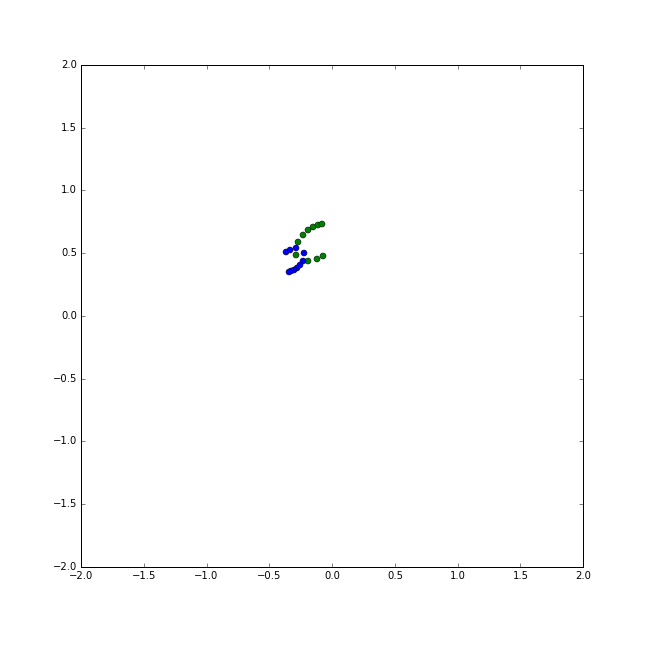
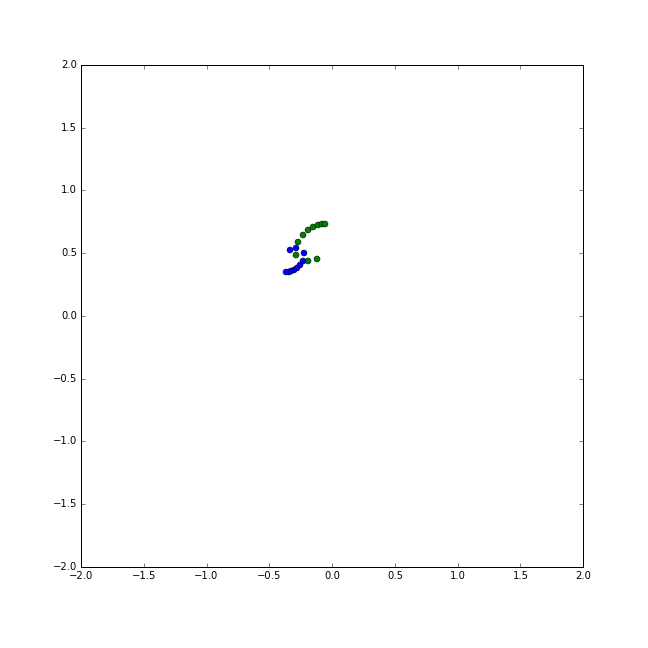
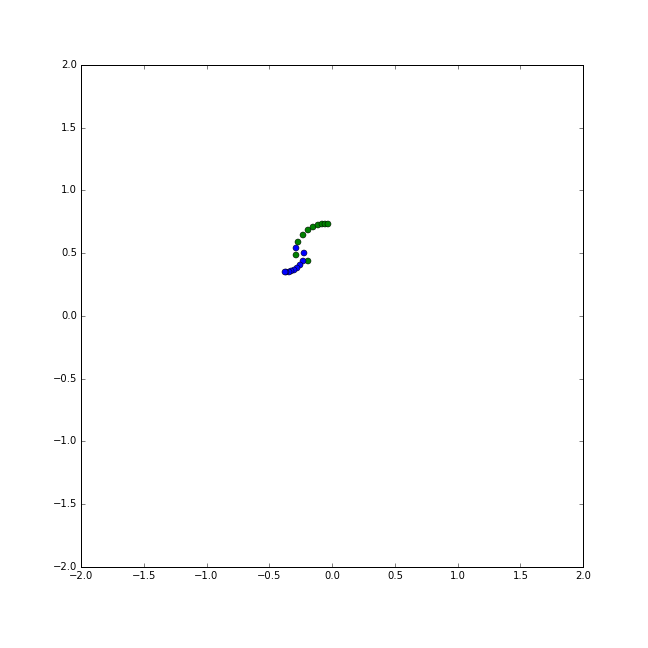
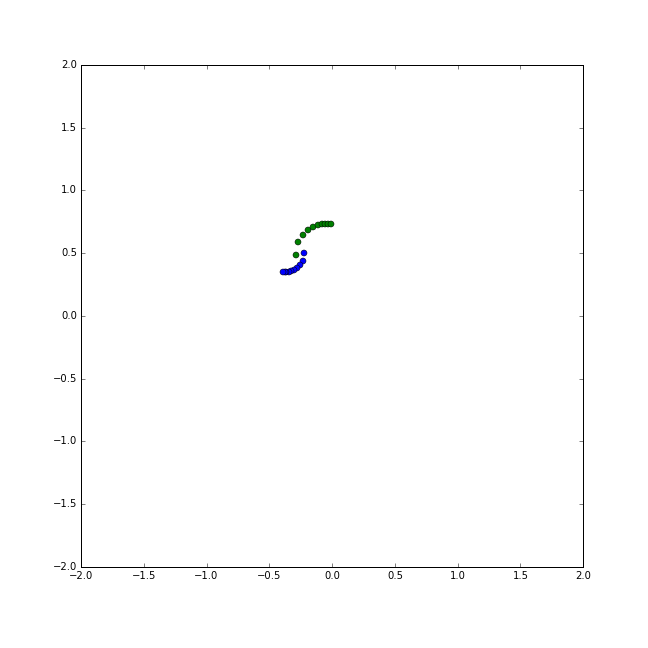
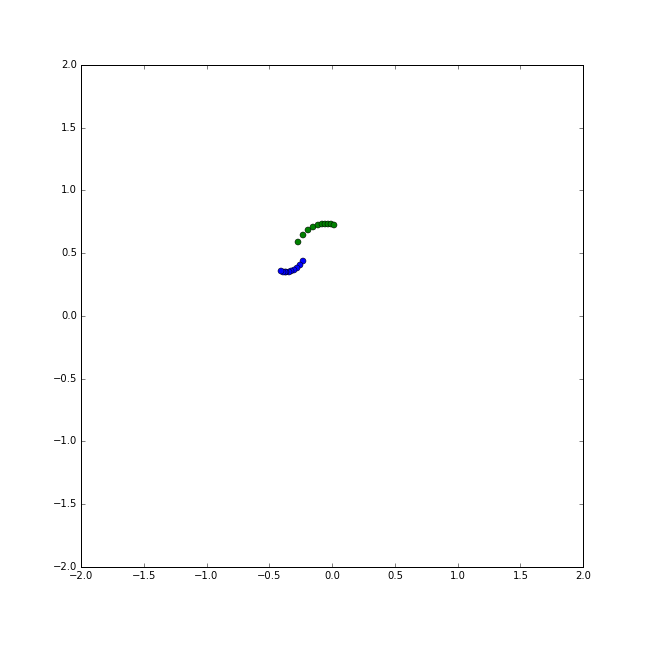

In [104]:
# Animation for 3 partciles

from matplotlib import animation
from JSAnimation import IPython_display

# First set up the figure, the axis, and the plot element we want to animate

fig = plt.figure(figsize = (9,9))
ax = plt.axes(xlim=(-2, 2), ylim=(-2, 2))
line0, = ax.plot([], [], marker = 'o', ls = ' ', color='r')
line1, = ax.plot([], [], marker = 'o', ls = ' ', color='g')
line2, = ax.plot([], [], marker = 'o', ls = ' ', color='b')

# Initialise each frame
def init():
    line0.set_data([], [])
    line1.set_data([], [])
    line2.set_data([], [])

    return line0, line1, line2

# Animate each frame

trail = 10
def animate3(i):
    if i > trail:
        #x0 = np.array(sol[i-trail:i,0])
        #y0 = np.array(sol[i-trail:i,1])
        
        #x1 = np.array(sol[i-trail:i,4])
        #y1 = np.array(sol[i-trail:i,5])
        
        #x2 = np.array(sol[i-trail:i,8])
        #y2 = np.array(sol[i-trail:i,9])
        
        x0 = np.array(sol[i-trail:i,0])
        y0 = np.array(sol[i-trail:i,1])
        
        x1 = np.array(sol[i-trail:i,4])
        y1 = np.array(sol[i-trail:i,5])
        
        x2 = np.array(sol[i-trail:i,8])
        y2 = np.array(sol[i-trail:i,9])
        
        
    else:
        x0 = np.array(sol[0:i,0])
        y0 = np.array(sol[0:i,1])
        
        x1 = np.array(sol[0:i,4])
        y1 = np.array(sol[0:i,5])
        
        x2 = np.array(sol[0:i,8])
        y2 = np.array(sol[0:i,9])
        
    line0.set_data(x0, y0)
    line1.set_data(x1, y1)
    line2.set_data(x2, y2)

    return line0, line1, line2,

# Run and save the animation

animation.FuncAnimation(fig, animate3, frames=500, interval=20, init_func=init, blit=True)

#anim.save('animation3.gif', writer='imagemagick', fps=30) 



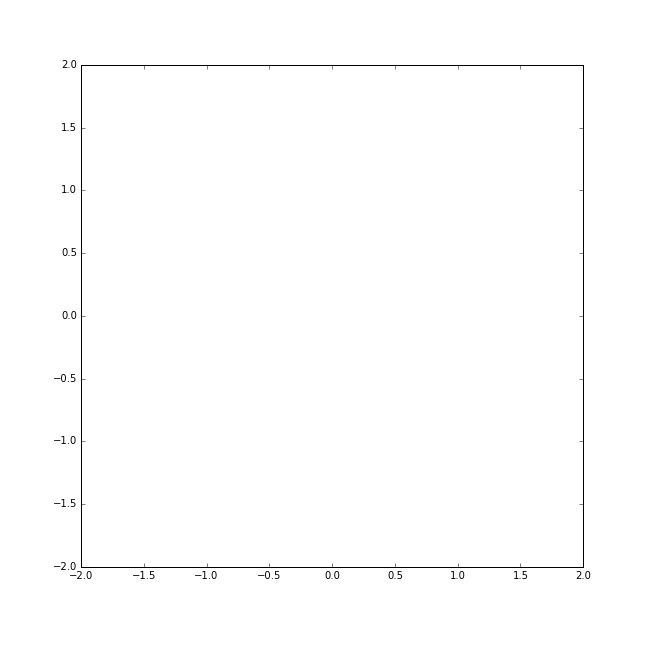
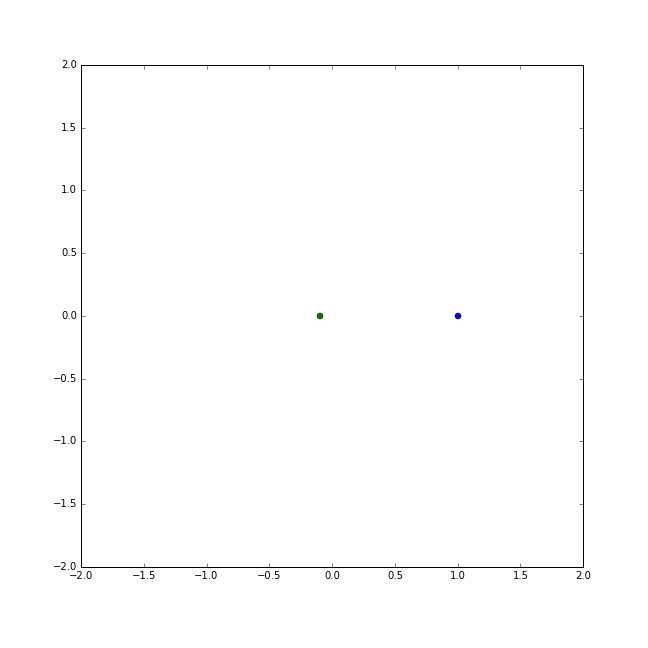
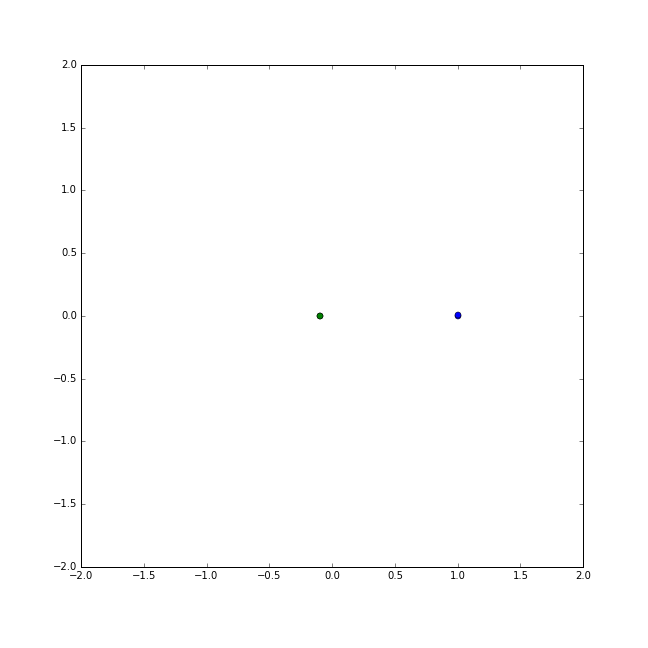
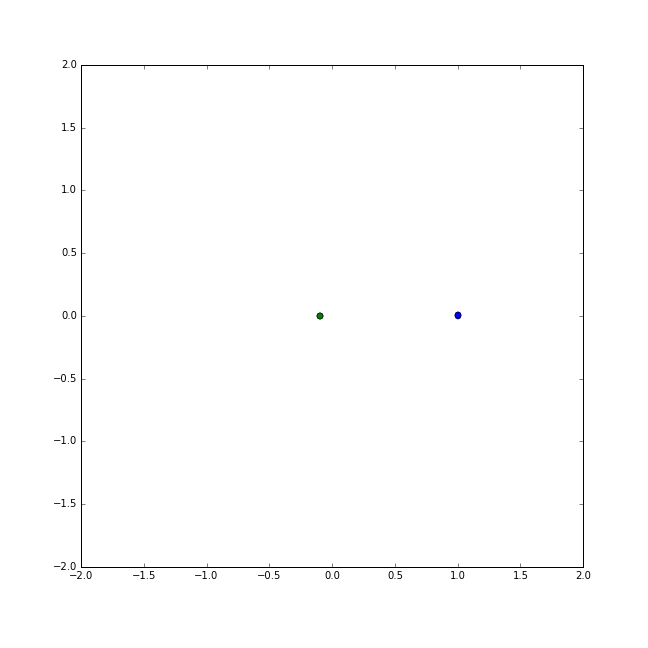
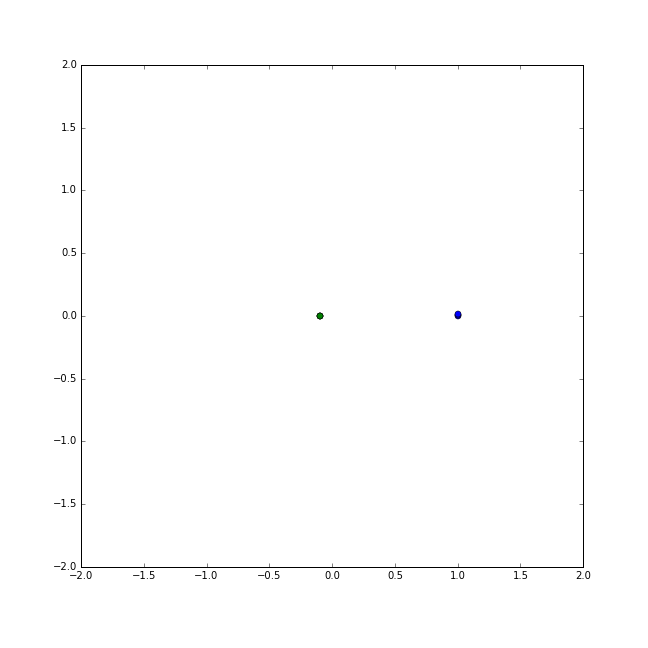
...
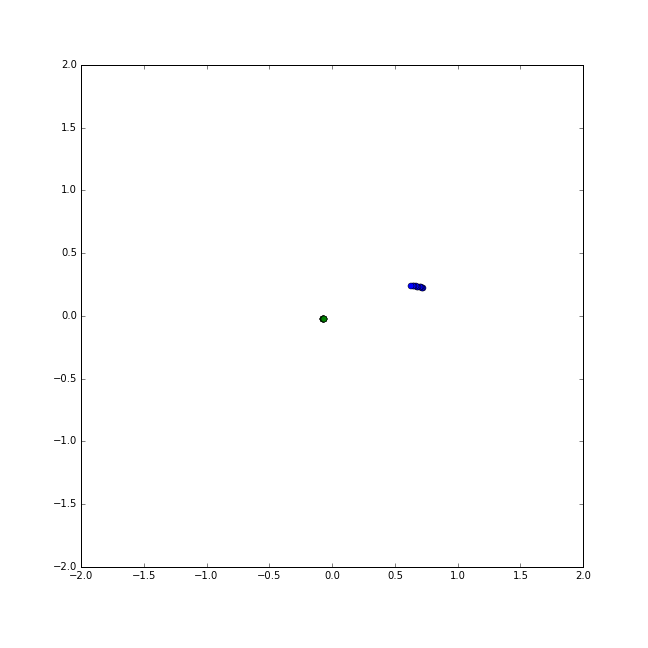
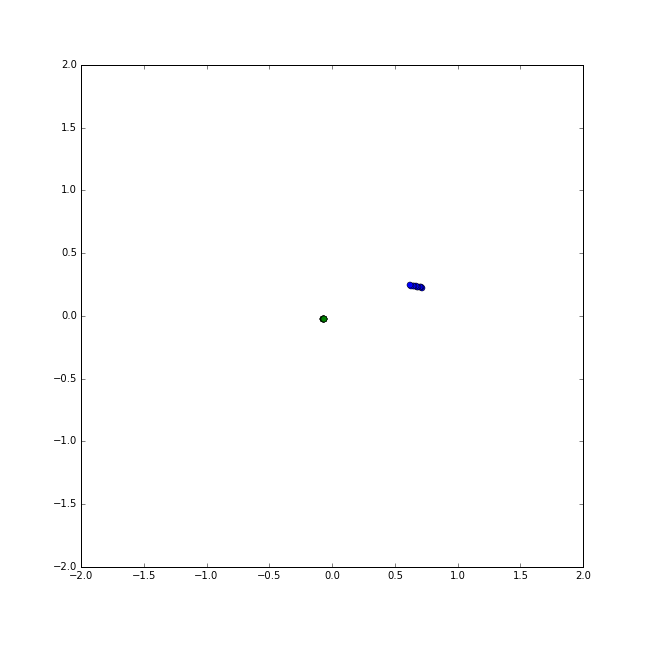
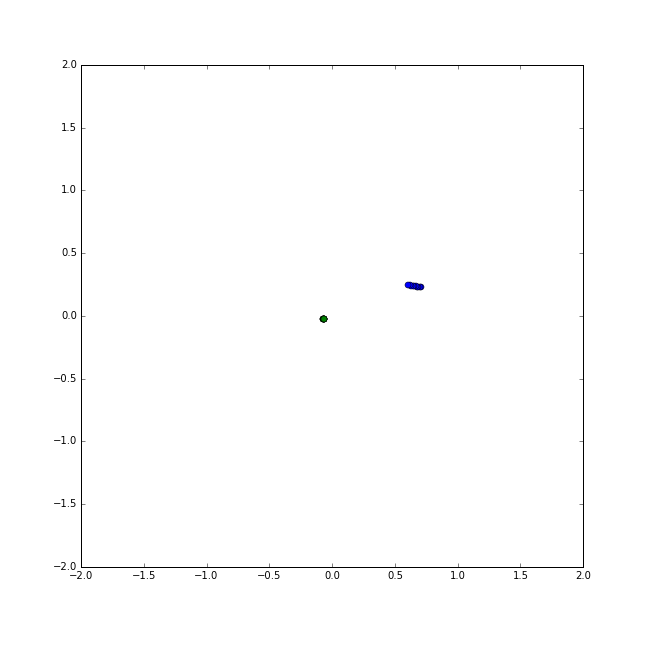
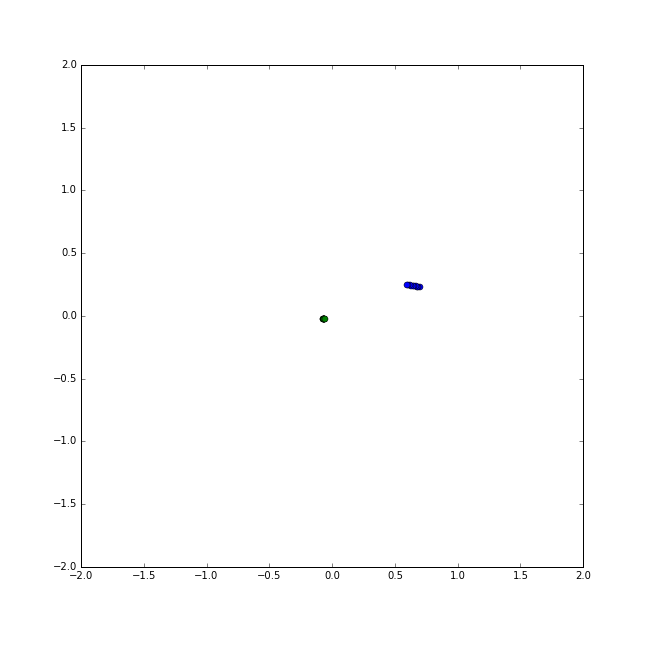
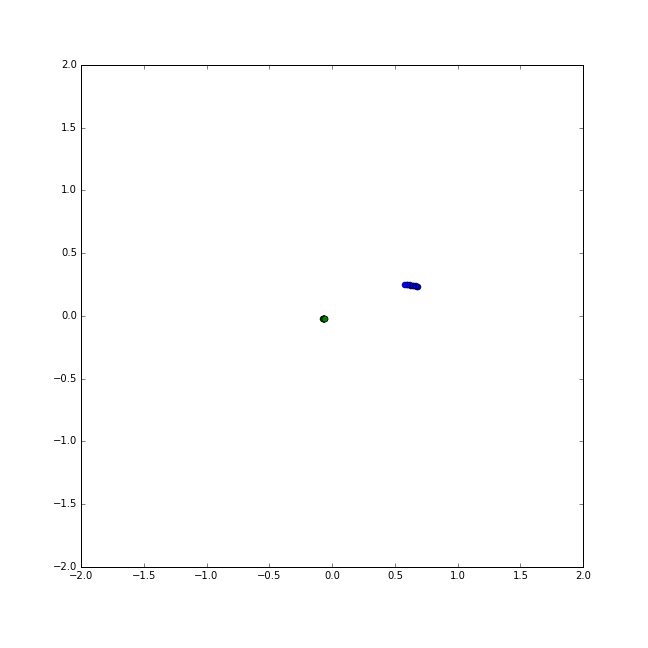

In [57]:
# Animation for two particles

from matplotlib import animation
from JSAnimation import IPython_display

# First set up the figure, the axis, and the plot element we want to animate

fig = plt.figure(figsize = (9,9))
ax = plt.axes(xlim=(-2, 2), ylim=(-2, 2))
line0, = ax.plot([], [], marker = 'o', ls = ' ')
line1, = ax.plot([], [], marker = 'o', ls = ' ')


# Initialise each frame

def init():
    line0.set_data([], [])
    line1.set_data([], [])

    return line0, line1,

# Animate each frame

trail = 10
def animate2(i):
    if i > trail:
        #x0 = np.array(sol[i-trail:i,0])
        #y0 = np.array(sol[i-trail:i,1])
        
        #x1 = np.array(sol[i-trail:i,4])
        #y1 = np.array(sol[i-trail:i,5])
        
        #x2 = np.array(sol[i-trail:i,8])
        #y2 = np.array(sol[i-trail:i,9])
        
        x0 = np.array(sol[i-trail:i,0])
        y0 = np.array(sol[i-trail:i,1])
        
        x1 = np.array(sol[i-trail:i,4])
        y1 = np.array(sol[i-trail:i,5])
    
        
    else:
        x0 = np.array(sol[0:i,0])
        y0 = np.array(sol[0:i,1])
        
        x1 = np.array(sol[0:i,4])
        y1 = np.array(sol[0:i,5])
        

    line0.set_data(x0, y0)
    line1.set_data(x1, y1)

    return line0, line1,

# Run and save the animation

animation.FuncAnimation(fig, animate2, frames=500, interval=20, init_func=init, blit=True)

#anim.save('animation3.gif', writer='imagemagick', fps=30) 
